# Imports

In [1]:
import os
from pathlib import Path
import pandas as pd

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import pyfolio as pf
from pyfolio.plotting import plot_rolling_returns,plot_rolling_sharpe
from pyfolio.timeseries import forecast_cone_bootstrap

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
from backtester import BackTester

In [6]:
data_store=Path("../Prepared_Data_Store")

# BackTesting

## Trading Strategy-I:

### Here we will long the top returns and short the bottom returns values at a particular day as predicted by our Combined Model

In [7]:
trading_strategy={
    "strategy":"returns_based",
    "values":{}
}

In [8]:
backtester=BackTester(
    n_longs=20,
    n_shorts=20,
    min_positions=10,
    capital_base=1e6,
    commission_cost=0.00075,
    commission_min_trade_cost=0.01,
    slippage_spread=0.0,
    predictions_file=os.path.join(data_store,"factors.csv"),
    predictions_column_name="Combined_Factor",
    trading_strategy=trading_strategy
)

In [9]:
results=backtester.run_backtesting()

INFO: Model predictions loaded...
INFO: Missing Date Values added in Model Predictions...
INFO: Model Data Loader created...
INFO: Backtesting started for trading strategy-I...
INFO: Backtesting completed...


### Performance analysis using Pyfolio

#### Loading Benchmark Data

In [10]:
benchmark_data=pd.read_csv(
    os.path.join(data_store,"sp500_data.csv"),
    parse_dates=["date"],
    index_col=["date"]
)

In [11]:
benchmark_data=benchmark_data.sp500_returns.tz_localize("UTC")

#### Extracting information from Zipline Results

In [12]:
returns,positions,transactions=pf.utils.extract_rets_pos_txn_from_zipline(results)

#### Plotting Rolling Returns and Sharpe Ratio

In [13]:
LIVE_DATE="2016-02-24"

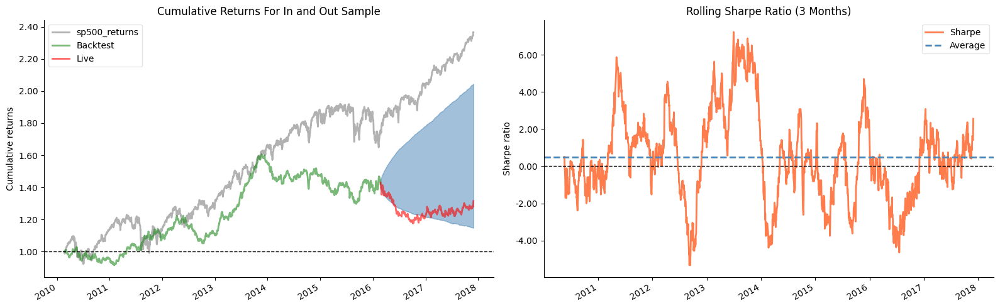

In [14]:
fig,axes=plt.subplots(ncols=2,figsize=(16,5))

plot_rolling_returns(
    returns,
    factor_returns=benchmark_data,
    live_start_date=LIVE_DATE,
    logy=False,
    cone_std=2,
    legend_loc="best",
    volatility_match=False,
    cone_function=forecast_cone_bootstrap,
    ax=axes[0]
)

plot_rolling_sharpe(returns,rolling_window=63,ax=axes[1])

axes[0].set_title("Cumulative Returns For In and Out Sample")
axes[1].set_title("Rolling Sharpe Ratio (3 Months)")

sns.despine()
fig.tight_layout()

#### Full Tear Sheet

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,26.94,2013-11-21,2016-10-06,NaT,NaN
1,14.10,2012-05-25,2012-10-15,2013-02-14,190
2,11.10,2010-05-17,2011-02-02,2011-05-25,268
3,6.38,2011-11-30,2011-12-22,2012-02-14,55
4,4.83,2010-03-03,2010-03-25,2010-04-19,34


Stress Events,mean,min,max
US downgrade/European Debt Crisis,0.37%,-1.71%,3.46%
Fukushima,0.04%,-0.87%,0.66%
EZB IR Event,-0.05%,-0.97%,1.19%
Flash Crash,0.32%,-0.15%,0.68%
Apr14,0.03%,-1.68%,2.01%
Oct14,-0.02%,-1.37%,2.19%
Fall2015,-0.02%,-1.40%,0.92%
Recovery,0.02%,-2.64%,3.46%
New Normal,0.02%,-2.63%,3.05%


Top 10 long positions of all time,max
sid,
NFLX,28.37%
PCG,24.69%
URI,23.48%
WTW,21.52%
NRG,21.37%
VRTX,20.62%
VRSN,20.16%
BLDR,19.94%
AOS,19.78%


Top 10 short positions of all time,max
sid,
NFLX,-34.11%
NRG,-25.79%
VRTX,-25.41%
EW,-20.38%
DGX,-19.95%
DXCM,-19.89%
AMD,-19.73%
ROK,-19.61%
TMUS,-17.29%


Top 10 positions of all time,max
sid,
NFLX,34.11%
NRG,25.79%
VRTX,25.41%
PCG,24.69%
URI,23.48%
WTW,21.52%
EW,20.38%
VRSN,20.16%
DGX,19.95%


Summary stats,All trades,Short trades,Long trades
Total number of round_trips,74582.00,36161.00,38421.00
Percent profitable,0.50,0.48,0.51
Winning round_trips,37098.00,17354.00,19744.00
Losing round_trips,36860.00,18520.00,18340.00
Even round_trips,624.00,287.00,337.00


PnL stats,All trades,Short trades,Long trades
Total profit,$497420.68,$-992654.92,$1490075.60
Gross profit,$24570469.65,$11363045.56,$13207424.09
Gross loss,$-24073048.97,$-12355700.48,$-11717348.50
Profit factor,$1.02,$0.92,$1.13
Avg. trade net profit,$6.67,$-27.45,$38.78
Avg. winning trade,$662.31,$654.78,$668.93
Avg. losing trade,$-653.09,$-667.15,$-638.90
Ratio Avg. Win:Avg. Loss,$1.01,$0.98,$1.05
Largest winning trade,$46125.59,$35546.97,$46125.59
Largest losing trade,$-33437.43,$-16030.80,$-33437.43


Duration stats,All trades,Short trades,Long trades
Avg duration,1 days 13:43:33.187927381,1 days 13:41:18.913470313,1 days 13:45:39.564092553
Median duration,1 days 00:00:00,1 days 00:00:00,1 days 00:00:00
Longest duration,265 days 23:00:00,265 days 23:00:00,147 days 00:00:00
Shortest duration,0 days 00:00:00,0 days 00:00:00,0 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,0.00%,-0.00%,0.00%
Avg returns winning,0.05%,0.05%,0.05%
Avg returns losing,-0.05%,-0.05%,-0.05%
Median returns all round_trips,0.00%,-0.00%,0.00%
Median returns winning,0.03%,0.03%,0.03%
Median returns losing,-0.03%,-0.03%,-0.03%
Largest winning trade,2.58%,2.58%,1.88%
Largest losing trade,-2.67%,-1.25%,-2.67%


Symbol stats,A,ACGL,ACN,ADI,ADM,ADP,ADSK,AEE,AEP,AES,AFL,AIG,AIZ,AJG,ALB,ALGN,ALL,AMAT,AMD,AME,AMGN,AMP,AMT,AON,AOS,APA,APD,APH,ARE,ATO,AVB,AVGO,AVY,AWK,AXP,AZO,BA,BAC,BAX,BBY,BDX,BEN,BG,BIIB,BK,BLDR,BLK,BMY,BR,BRO,BSX,BXP,C,CAG,CAH,CAT,CB,CCI,CCL,CDNS,CF,CHD,CHRW,CI,CINF,CL,CLX,CME,CMG,CMI,CMS,CNC,CNP,COF,COO,COP,CPB,CPRT,CPT,CRL,CRM,CSCO,CSGP,CSX,CTAS,CTSH,CVS,CVX,D,DAL,DE,DECK,DG,DGX,DHI,DHR,DIS,DLR,DLTR,DOV,DPZ,DRI,DTE,DUK,DVA,DVN,DXCM,EA,EBAY,ECL,ED,EFX,EIX,EL,EMN,EMR,EOG,EQIX,EQR,EQT,ERIE,ES,ESS,ETN,ETR,EW,EXC,EXPD,EXPE,EXR,F,FCX,FDS,FDX,FE,FFIV,FICO,FIS,FITB,FOX,FOXA,FRT,FTNT,GD,GE,GILD,GIS,GLW,GOOGL,GPC,GPN,GRMN,GS,GWW,HAL,HAS,HBAN,HD,HIG,HOLX,HON,HPQ,HRL,HSIC,HST,HSY,HUM,IBM,ICE,IDXX,IEX,IFF,INCY,INTU,IP,IPG,IR,IRM,ISRG,IT,ITW,IVZ,JBHT,JBL,JCI,JKHY,JNJ,JPM,K,KEY,KIM,KLAC,KMB,KMX,KO,KR,L,LDOS,LEN,LH,LII,LKQ,LLY,LMT,LNT,LRCX,LUV,LVS,LYV,MA,MAA,MAR,MAS,MCD,MCHP,MCK,MCO,MDLZ,MDT,MET,MGM,MHK,MKC,MKTX,MLM,MMC,MNST,MO,MOH,MOS,MPWR,MRK,MS,MSCI,MSFT,MSI,MTB,MTD,MU,NDAQ,NDSN,NEE,NEM,NFLX,NI,NKE,NOC,NRG,NSC,NTAP,NTRS,NUE,NVDA,NVR,O,ODFL,OKE,OMC,ORCL,ORLY,OXY,PAYX,PCAR,PCG,PEG,PEP,PFE,PFG,PG,PGR,PH,PHM,PKG,PLD,PM,PNC,PNR,PNW,PODD,POOL,PPG,PPL,PRU,PSA,PWR,RCL,REG,REGN,RF,RJF,RL,RMD,ROK,ROL,ROP,ROST,RSG,SBAC,SBUX,SCHW,SHW,SJM,SLB,SMCI,SNA,SNPS,SO,SPG,SRE,STE,STLD,STT,STX,STZ,SWK,SWKS,SYK,SYY,T,TAP,TDG,TDY,TECH,TEL,TER,TGT,TJX,TMO,TMUS,TRMB,TROW,TSCO,TSN,TTWO,TXN,TXT,TYL,UAL,UDR,UHS,ULTA,UNH,UNP,UPS,URI,USB,V,VLO,VMC,VRSK,VRSN,VRTX,VTR,VZ,WAB,WAT,WBA,WDC,WEC,WFC,WM,WMB,WMT,WRB,WSM,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA
Avg returns all round_trips,0.01%,0.00%,-0.00%,0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.01%,-0.03%,0.00%,0.01%,-0.00%,-0.01%,-0.01%,-0.01%,-0.01%,-0.00%,-0.01%,0.02%,0.01%,-0.00%,-0.00%,-0.01%,-0.00%,0.01%,-0.00%,-0.00%,-0.01%,0.01%,0.01%,0.01%,0.00%,-0.00%,0.00%,0.02%,0.00%,0.01%,0.01%,-0.00%,0.01%,0.00%,-0.00%,0.01%,0.01%,-0.01%,0.00%,0.00%,0.01%,-0.01%,0.00%,0.00%,-0.01%,0.01%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0.00%,-0.01%,-0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,0.00%,-0.00%,0.01%,-0.01%,-0.00%,-0.00%,-0.00%,0.01%,0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0.00%,0.00%,-0.00%,0.00%,0.01%,-0.00%,0.01%,-0.00%,-0.00%,0.02%,0.00%,0.00%,-0.00%,0.01%,-0.00%,0.00%,-0.00%,0.00%,-0.01%,-0.00%,-0.01%,0.02%,0.01%,-0.00%,0.01%,-0.00%,-0.02%,0.00%,0.00%,0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.01%,-0.01%,-0.04%,-0.00%,-0.00%,0.00%,-0.00%,-0.01%,0.00%,0.01%,-0.02%,-0.01%,-0.00%,-0.00%,-0.00%,0.01%,0.00%,-0.01%,0.01%,0.00%,-0.01%,0.00%,0.00%,0.01%,0.00%,0.01%,0.01%,0.02%,0.01%,0.00%,-0.00%,0.01%,0.00%,-0.00%,0.01%,0.02%,0.00%,0.01%,0.00%,0.00%,0.00%,0.00%,-0.02%,0.01%,0.00%,0.01%,0.00%,0.01%,0.00%,-0.01%,-0.00%,0.00%,-0.01%,-0.00%,-0.01%,0.00%,-0.00%,-0.00%,-0.00%,-0.02%,0.02%,0.01%,0.01%,-0.00%,0.00%,0.01%,-0.00%,0.00%,-0.00%,0.01%,-0.00%,-0.00%,-0.01%,0.00%,-0.00%,-0.00%,0.00%,-0.01%,-0.00%,-0.01%,0.01%,-0.01%,0.01%,0.01%,-0.00%,0.00%,0.01%,0.00%,0.01%,-0.00%,0.00%,0.02%,-0.00%,-0.01%,-0.00%,-0.00%,0.00%,-0.01%,0.00%,0.00%,0.01%,0.00%,-0.01%,-0.00%,0.01%,0.01%,0.00%,-0.00%,0.00%,0.00%,0.01%,0.02%,-0.00%,0.01%,0.01%,0.01%,0.00%,0.01%,0.01%,0.01%,-0.00%,0.01%,0.01%,-0.00%,0.00%,0.00%,-0.02%,-0.01%,-0.01%,0.01%,0.00%,0.00%,0.00%,0.00%,-0.01%,0.00%,-0.01%,-0.00%,0.00%,-0.00%,-0.01%,-0.00%,0.00%,0.00%,0.00%,0.01%,0.01%,-0.00%,-0.00%,0.00%,-0.00%,-0.01%,-0.00%,0.00%,0.01%,0.01%,-0.01%,-0.01%,0.01%,-0.00%,-0.00%,-0.01%,0.00%,0.01%,-0.00%,-0.01%,0.01%,0.01%,0.00%,0.01%,-0.00%,-0.03%,0.00%,-0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.01%,-0.00%,-0.00%,-0.00%,-0.01%,-0.01%,0.00%,-0.00%,0.00%,-0.00%,0.00%,0.00%,0.00%,0.01%,0.01%,0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.01%,0.01%,-0.00%,0.00%,-0.00%,0.00%,0.00%,0.00%,-0.01%,-0.00%,0.00%,0.00%,-0.00%,0.00%,-0.00%,0.01%,0.02%,-0.00%,-0.00%,0.00%,-0.01%,-0.00%,0.00%,0.00%,-0.01%,0.02%,0.00%,0.00%,-0.02%,-0.01%,0.01%,0.01%,-0.01%,-0.00%,0.00%,0.01%,0.01%,-0.00%,-0.01%,0.00%,0.01%,-0.00%,0.02%,0.00%,-0.00%,0.00%,-0.00%,-0.01%,0.01%,0.01%,-0.00%,0.01%,0.00%,0.01%,-0.00%
Avg returns winning,

Profitability (PnL / PnL total) per name,
symbol,
BLDR,15.30%
BBY,11.22%
GIS,9.50%
EBAY,8.67%
PWR,8.09%
MSI,7.76%
WMB,7.56%
MAS,7.43%
MNST,7.21%


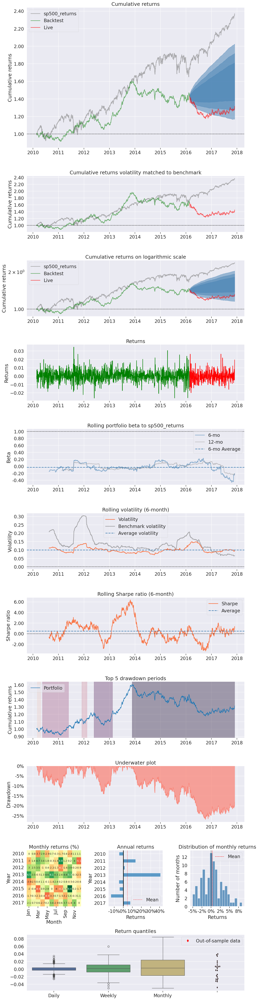

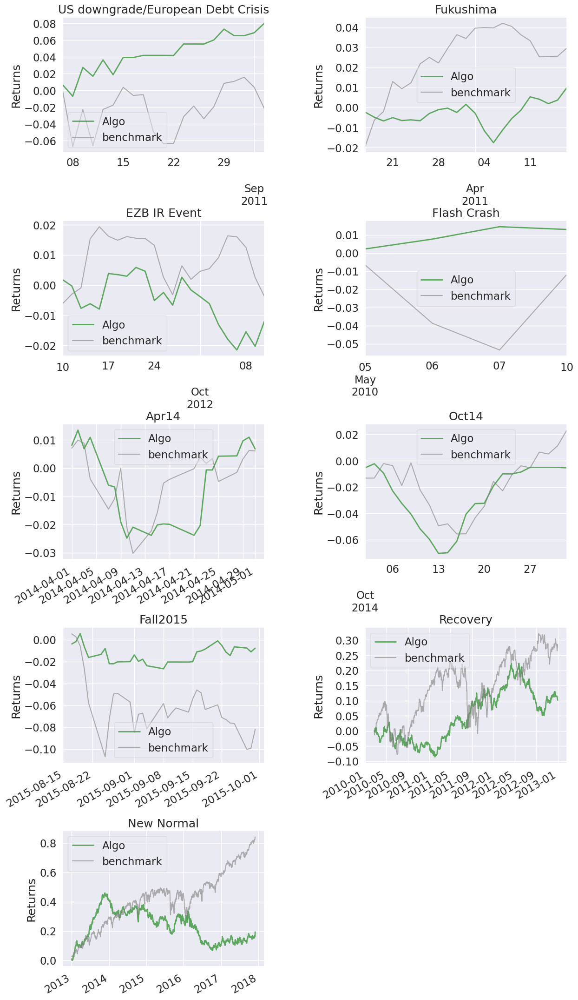

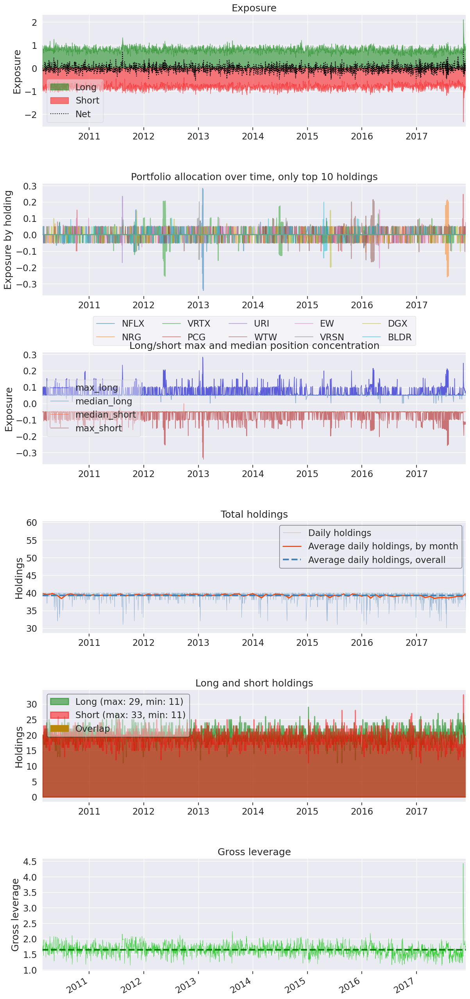

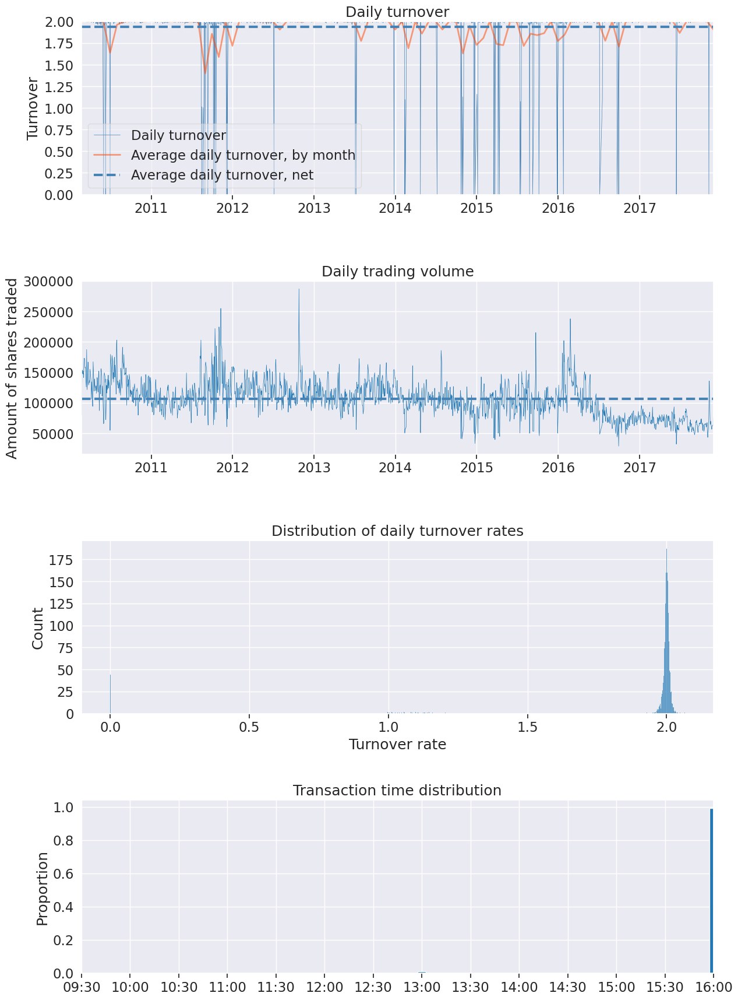

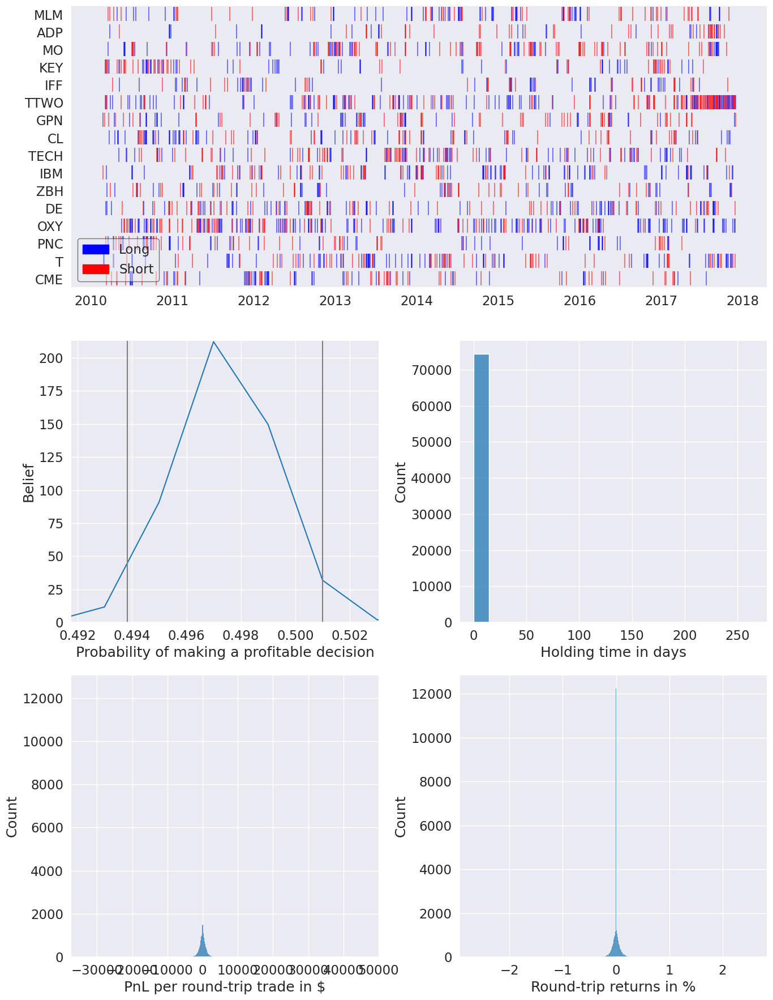

In [15]:
pf.create_full_tear_sheet(
    returns,
    positions=positions,
    transactions=transactions,
    benchmark_rets=benchmark_data,
    live_start_date=LIVE_DATE,
    round_trips=True
)

## Trading Strategy-II:

### As per the Signal Evaluation of the Combined Model Factors, we will long and short predictions in quantiles 5 and 2 respectively.

In [16]:
trading_strategy={
    "strategy":"quantile_based",
    "values":{
        "quantile_long":5,
        "quantile_short":2
}

}

In [17]:
backtester=BackTester(
    n_longs=20,
    n_shorts=20,
    min_positions=10,
    capital_base=1e6,
    commission_cost=0.00075,
    commission_min_trade_cost=0.01,
    slippage_spread=0.0,
    predictions_file=os.path.join(data_store,"factors.csv"),
    predictions_column_name="Combined_Factor",
    trading_strategy=trading_strategy
)

In [18]:
results=backtester.run_backtesting()

INFO: Model predictions loaded...
INFO: Missing Date Values added in Model Predictions...
INFO: Model Data Loader created...
INFO: Backtesting started for trading strategy-II...
INFO: Backtesting completed...


### Performance analysis using Pyfolio

#### Extracting information from Zipline Results

In [19]:
returns,positions,transactions=pf.utils.extract_rets_pos_txn_from_zipline(results)

#### Plotting Rolling Returns and Sharpe Ratio

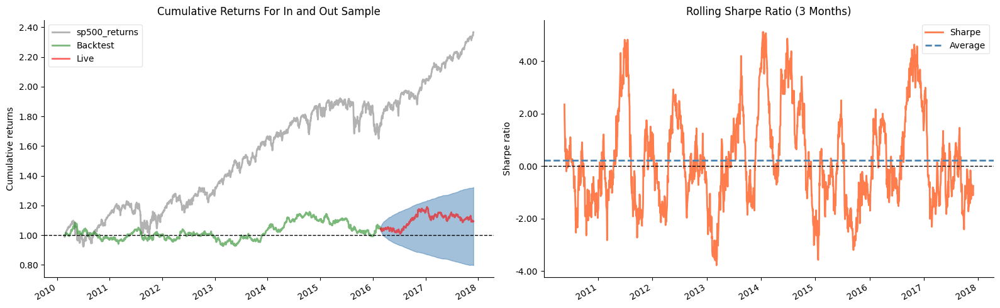

In [20]:
fig,axes=plt.subplots(ncols=2,figsize=(16,5))

plot_rolling_returns(
    returns,
    factor_returns=benchmark_data,
    live_start_date=LIVE_DATE,
    logy=False,
    cone_std=2,
    legend_loc="best",
    volatility_match=False,
    cone_function=forecast_cone_bootstrap,
    ax=axes[0]
)

plot_rolling_sharpe(returns,rolling_window=63,ax=axes[1])

axes[0].set_title("Cumulative Returns For In and Out Sample")
axes[1].set_title("Rolling Sharpe Ratio (3 Months)")

sns.despine()
fig.tight_layout()

#### Full Tear Sheet

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.72,2010-05-06,2013-02-26,2014-05-06,1044
1,14.34,2014-10-20,2015-12-30,2016-11-09,538
2,8.74,2017-01-11,2017-09-15,NaT,NaN
3,2.93,2014-05-22,2014-06-09,2014-07-23,45
4,2.49,2016-12-06,2016-12-29,2017-01-09,25


Stress Events,mean,min,max
US downgrade/European Debt Crisis,-0.00%,-1.58%,2.10%
Fukushima,0.04%,-0.80%,1.03%
EZB IR Event,0.04%,-0.58%,0.64%
Flash Crash,-0.01%,-1.17%,1.71%
Apr14,0.24%,-0.70%,0.99%
Oct14,-0.10%,-0.75%,0.68%
Fall2015,-0.04%,-1.10%,1.04%
Recovery,0.00%,-1.93%,2.47%
New Normal,0.01%,-2.15%,3.07%


Top 10 long positions of all time,max
sid,
AES,41.06%
AWK,29.82%
CB,25.34%
CNC,25.32%
BAC,25.30%
ACGL,25.27%
BG,25.18%
CRM,25.18%
BIIB,25.00%


Top 10 short positions of all time,max
sid,
AES,-33.03%
BAC,-30.29%
APA,-29.73%
BG,-29.58%
ADSK,-26.06%
BR,-25.84%
CB,-25.62%
ADI,-25.61%
APH,-25.50%


Top 10 positions of all time,max
sid,
AES,41.06%
BAC,30.29%
AWK,29.82%
APA,29.73%
BG,29.58%
ADSK,26.06%
BR,25.84%
CB,25.62%
ADI,25.61%


Summary stats,All trades,Short trades,Long trades
Total number of round_trips,77621.00,39323.00,38298.00
Percent profitable,0.49,0.47,0.52
Winning round_trips,38348.00,18401.00,19947.00
Losing round_trips,38514.00,20532.00,17982.00
Even round_trips,759.00,390.00,369.00


PnL stats,All trades,Short trades,Long trades
Total profit,$-282353.92,$-1687313.58,$1404959.65
Gross profit,$22164464.20,$10834419.28,$11330044.91
Gross loss,$-22446818.12,$-12521732.86,$-9925085.26
Profit factor,$0.99,$0.87,$1.14
Avg. trade net profit,$-3.64,$-42.91,$36.68
Avg. winning trade,$577.98,$588.80,$568.01
Avg. losing trade,$-582.82,$-609.86,$-551.95
Ratio Avg. Win:Avg. Loss,$0.99,$0.97,$1.03
Largest winning trade,$43417.96,$43417.96,$18643.20
Largest losing trade,$-88798.12,$-88798.12,$-53371.60


Duration stats,All trades,Short trades,Long trades
Avg duration,1 days 22:24:20.898274951,2 days 03:21:12.628944892,1 days 17:19:32.458013473
Median duration,1 days 00:00:00,1 days 00:00:00,1 days 00:00:00
Longest duration,126 days 01:00:00,80 days 00:00:00,126 days 01:00:00
Shortest duration,0 days 00:00:00,0 days 00:00:00,0 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,-0.00%,-0.00%,0.00%
Avg returns winning,0.06%,0.06%,0.05%
Avg returns losing,-0.06%,-0.06%,-0.05%
Median returns all round_trips,0.00%,-0.00%,0.00%
Median returns winning,0.03%,0.03%,0.03%
Median returns losing,-0.03%,-0.03%,-0.03%
Largest winning trade,3.94%,3.94%,1.82%
Largest losing trade,-8.81%,-8.81%,-4.97%


Symbol stats,A,ACGL,ACN,ADI,ADM,ADP,ADSK,AEE,AEP,AES,AFL,AIG,AIZ,AJG,ALB,ALGN,ALL,AMAT,AMD,AME,AMGN,AMP,AMT,AON,AOS,APA,APD,APH,ARE,ATO,AVB,AVGO,AVY,AWK,AXP,AZO,BA,BAC,BAX,BBY,BDX,BEN,BG,BIIB,BK,BLDR,BLK,BMY,BR,BRO,BSX,BXP,C,CAG,CAH,CAT,CB,CCI,CCL,CDNS,CF,CHD,CHRW,CI,CINF,CL,CLX,CME,CMG,CMI,CMS,CNC,CNP,COF,COO,COP,CPB,CPRT,CPT,CRL,CRM,CSCO,CSGP,CSX,CTAS,CTSH,CVS,CVX,D,DAL,DE,DECK,DG,DGX,DHI,DHR,DIS,DLR,DLTR,DOV,DPZ,DRI,DTE,DUK,DVA,DVN,DXCM,EA,EBAY,ECL,ED,EFX,EIX,EL,EMN,EMR,EOG,EQIX,EQR,EQT,ERIE,ES,ESS,ETN,ETR,EW,EXC,EXPD,EXPE,EXR,F,FCX,FDS,FDX,FE,FFIV,FICO,FIS,FITB,FOX,FOXA,FRT,FTNT,GD,GE,GILD,GIS,GLW,GOOGL,GPC,GPN,GRMN,GS,GWW,HAL,HAS,HOLX,HON,HPQ,HRL
Avg returns all round_trips,0.00%,0.00%,-0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,-0.01%,0.00%,-0.00%,0.00%,-0.00%,-0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,-0.00%,0.00%,0.01%,0.00%,-0.00%,0.00%,0.01%,0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,-0.01%,0.01%,-0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,0.00%,0.01%,-0.01%,0.00%,0.00%,0.00%,0.00%,-0.10%,0.00%,0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.01%,0.00%,0.00%,0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,0.00%,0.00%,-0.00%,0.00%,-0.00%,0.01%,-0.00%,-0.00%,0.00%,-0.00%,0.01%,0.00%,-0.00%,0.00%,-0.01%,0.00%,-0.01%,0.01%,-0.00%,0.00%,-0.01%,-0.00%,0.00%,-0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.01%,-0.00%,0.01%,-0.01%,-0.00%,-0.01%,0.00%,-0.01%,0.00%,0.01%,-0.00%,0.02%,0.00%,-0.00%,-0.00%,-0.00%,-0.01%,0.00%,0.02%,-0.01%,0.05%,0.00%,-0.01%,-0.00%,0.00%,-0.00%,0.05%,0.02%,-0.01%,0.00%,-0.01%,-0.01%,0.00%,-0.01%,0.00%,0.03%,-0.00%,-0.02%,0.02%,0.00%,0.05%,0.01%,0.02%,0.01%,0.04%,-0.04%,0.02%,-0.01%,-0.03%,0.00%,-0.03%,-0.03%,-0.04%,0.02%,-0.03%
Avg returns winning,0.06%,0.04%,0.04%,0.06%,0.06%,0.04%,0.08%,0.05%,0.03%,0.08%,0.06%,0.07%,0.05%,0.03%,0.07%,0.07%,0.04%,0.06%,0.11%,0.04%,0.04%,0.05%,0.05%,0.04%,0.05%,0.07%,0.05%,0.06%,0.05%,0.04%,0.05%,0.08%,0.05%,0.04%,0.05%,0.04%,0.05%,0.07%,0.04%,0.08%,0.04%,0.05%,0.05%,0.07%,0.05%,0.12%,0.07%,0.04%,0.05%,0.04%,0.06%,0.05%,0.30%,0.04%,0.05%,0.05%,0.04%,0.05%,0.05%,0.05%,0.10%,0.04%,0.04%,0.06%,0.04%,0.03%,0.03%,0.05%,0.06%,0.06%,0.04%,0.07%,0.04%,0.06%,0.05%,0.06%,0.03%,0.03%,0.05%,0.06%,0.10%,0.04%,0.05%,0.06%,0.04%,0.06%,0.04%,0.04%,0.04%,0.08%,0.05%,0.08%,0.05%,0.04%,0.07%,0.06%,0.04%,0.05%,0.05%,0.06%,0.07%,0.04%,0.04%,0.03%,0.04%,0.06%,0.08%,0.09%,0.06%,0.05%,0.03%,0.04%,0.04%,0.04%,0.06%,0.04%,0.11%,0.05%,0.05%,0.07%,0.04%,0.03%,0.04%,0.08%,0.03%,0.18%,0.04%,0.05%,0.07%,0.05%,0.07%,0.12%,0.04%,0.04%,0.04%,0.06%,0.06%,0.04%,0.06%,0.04%,0.03%,0.03%,0.06%,0.08%,0.09%,0.11%,0.04%,0.13%,0.02%,0.04%,0.01%,0.06%,0.02%,0.00%,0.07%,0.03%,NaN,NaN,0.02%,NaN
Avg returns losing,-0.06%,-0.04%,-0.04%,-0.05%,-0.05%,-0.03%,-0.08%,-0.04%,-0.04%,-0.07%,-0.06%,-0.06%,-0.05%,-0.04%,-0.06%,-0.07%,-0.04%,-0.06%,-0.11%,-0.04%,-0.05%,-0.06%,-0.05%,-0.03%,-0.05%,-0.07%,-0.04%,-0.04%,-0.05%,-0.04%,-0.05%,-0.08%,-0.04%,-0.04%,-0.04%,-0.04%,-0.06%,-0.06%,-0.04%,-0.07%,-0.04%,-0.05%,-0.05%,-0.07%,-0.05%,-0.12%,-0.05%,-0.05%,-0.04%,-0.04%,-0.06%,-0.05%,-0.33%,-0.04%,-0.05%,-0.05%,-0.03%,-0.05%,-0.05%,-0.06%,-0.11%,-0.05%,-0.05%,-0.05%,-0.04%,-0.04%,-0.03%,-0.05%,-0.07%,-0.06%,-0.04%,-0.06%,-0.04%,-0.05%,-0.05%,-0.05%,-0.03%,-0.04%,-0.05%,-0.06%,-0.09%,-0.04%,-0.06%,-0.06%,-0.04%,-0.06%,-0.04%,-0.04%,-0.03%,-0.09%,-0.05%,-0.08%,-0.05%,-0.04%,-0.07%,-0.08%,-0.05%,-0.05%,-0.06%,-0.05%,-0.05%,-0.05%,-0.04%,-0.03%,-0.05%,-0.08%,-0.08%,-0.07%,-0.09%,-0.04%,-0.04%,-0.04%,-0.04%,-0.05%,-0.04%,-0.04%,-0.08%,-0.05%,-0.04%,-0.07%,-0.05%,-0.04%,-0.03%,-0.06%,-0.04%,-0.08%,-0.03%,-0.06%,-0.05%,-0.04%,-0.06%,-0.06%,-0.03%,-0.05%,-0.04%,-0.08%,-0.05%,-0.04%,-0.05%,-0.05%,NaN,-0.02%,-0.09%,-0.04%,-0.05%,-0.03%,-0.03%,-0.04%,-0.00%,NaN,-0.05%,-0.04%,-0.03%,-0.06%,-0.03%,-0.09%,-0.03%,-0.04%,NaN,-0.03%
Median returns all round_trips,0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0

Profitability (PnL / PnL total) per name,
symbol,
C,247.59%
DHR,24.68%
AEP,18.26%
BA,18.22%
BMY,17.84%
CDNS,17.15%
DECK,16.55%
DAL,14.49%
CPRT,13.10%


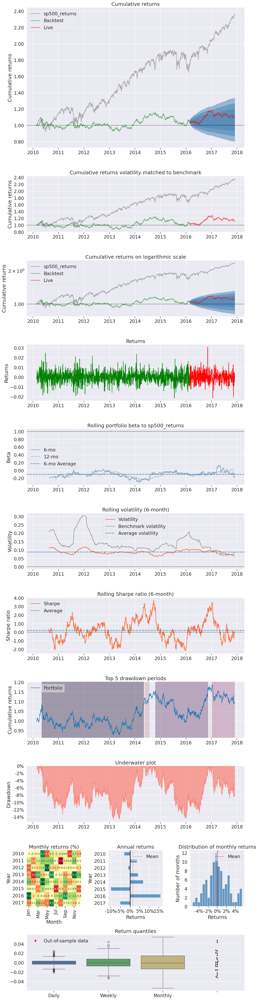

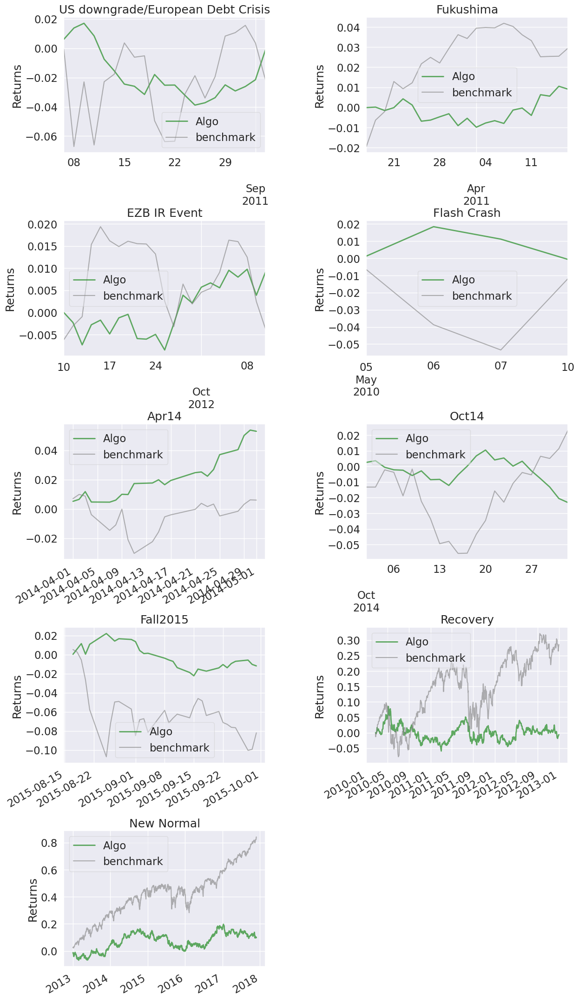

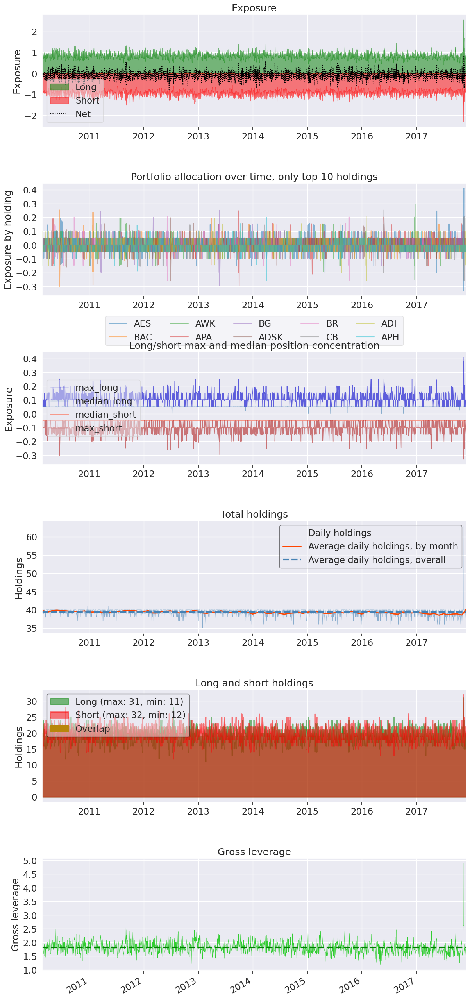

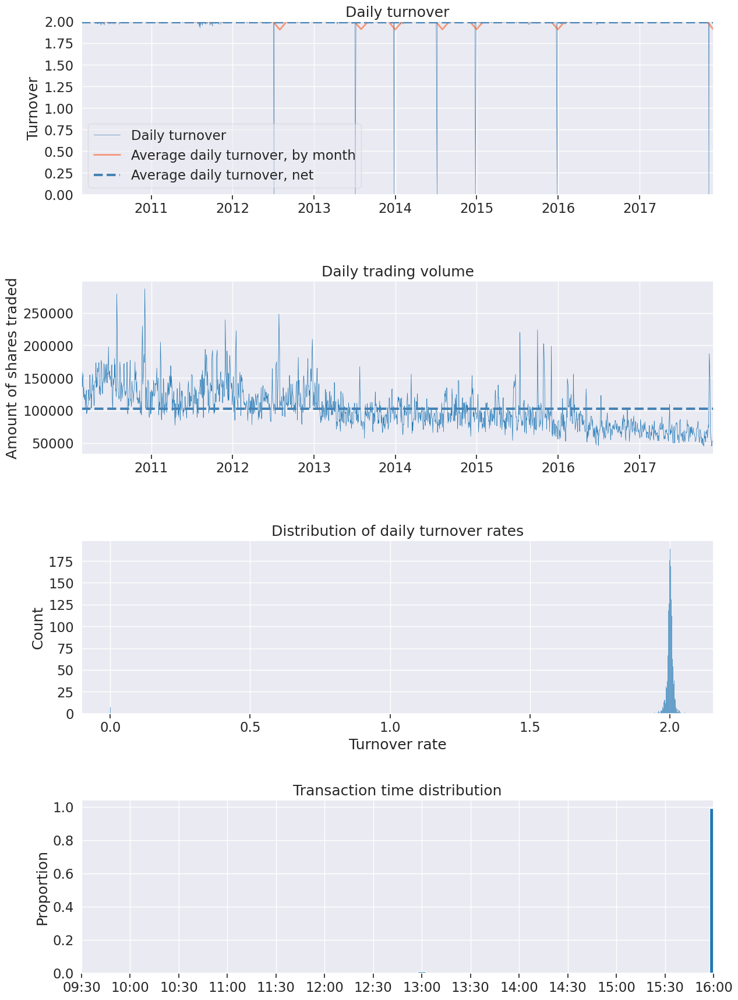

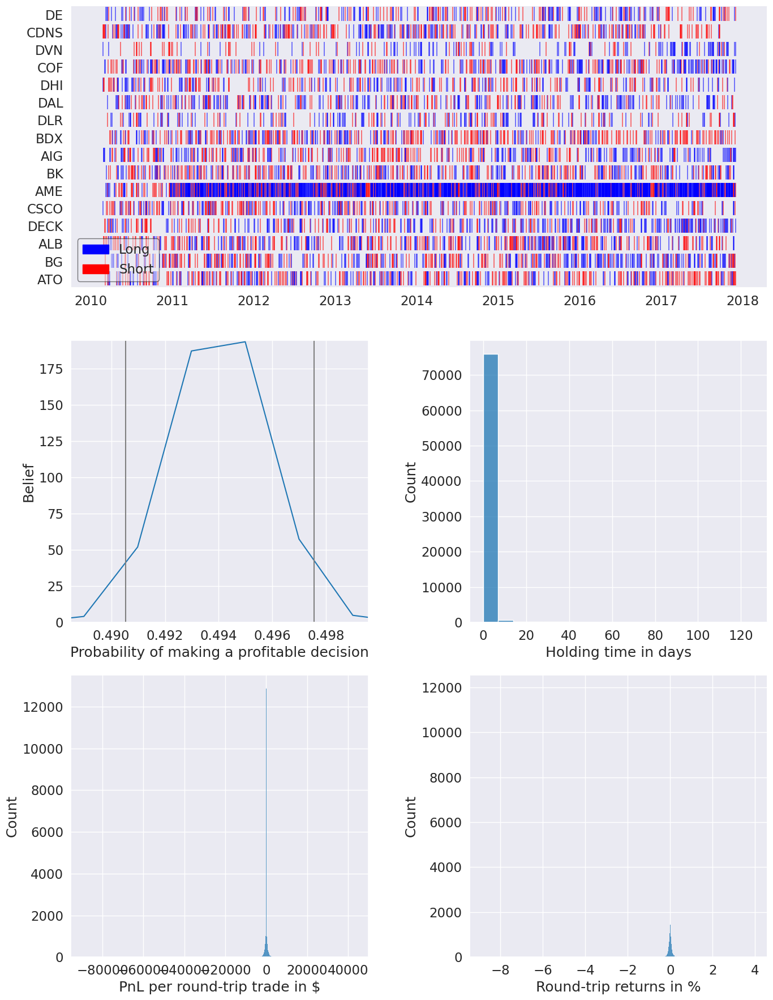

In [21]:
pf.create_full_tear_sheet(
    returns,
    positions=positions,
    transactions=transactions,
    benchmark_rets=benchmark_data,
    live_start_date=LIVE_DATE,
    round_trips=True
)

## Trading Strategy-III:

### As per the Signal Evaluation of the Combined Model Factors, we will long and short predictions in quantiles 1 and 4 respectively.

In [22]:
trading_strategy={
    "strategy":"quantile_based",
    "values":{
        "quantile_long":1,
        "quantile_short":4
}

}

In [23]:
backtester=BackTester(
    n_longs=20,
    n_shorts=20,
    min_positions=10,
    capital_base=1e6,
    commission_cost=0.00075,
    commission_min_trade_cost=0.01,
    slippage_spread=0.0,
    predictions_file=os.path.join(data_store,"factors.csv"),
    predictions_column_name="Combined_Factor",
    trading_strategy=trading_strategy
)

In [24]:
results=backtester.run_backtesting()

INFO: Model predictions loaded...
INFO: Missing Date Values added in Model Predictions...
INFO: Model Data Loader created...
INFO: Backtesting started for trading strategy-II...
INFO: Backtesting completed...


### Performance analysis using Pyfolio

#### Extracting information from Zipline Results

In [25]:
returns,positions,transactions=pf.utils.extract_rets_pos_txn_from_zipline(results)

#### Plotting Rolling Returns and Sharpe Ratio

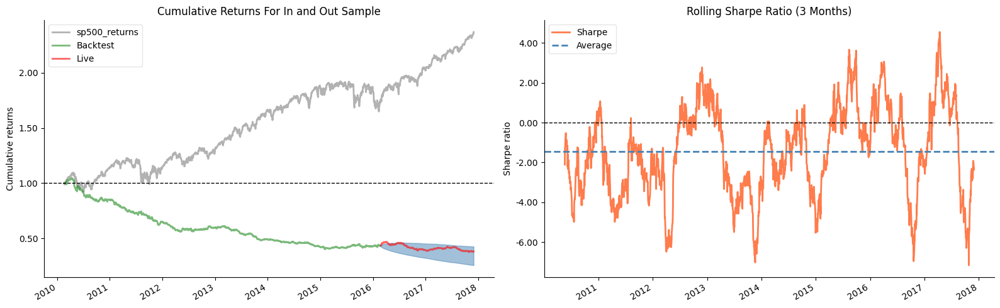

In [26]:
fig,axes=plt.subplots(ncols=2,figsize=(16,5))

plot_rolling_returns(
    returns,
    factor_returns=benchmark_data,
    live_start_date=LIVE_DATE,
    logy=False,
    cone_std=2,
    legend_loc="best",
    volatility_match=False,
    cone_function=forecast_cone_bootstrap,
    ax=axes[0]
)

plot_rolling_sharpe(returns,rolling_window=63,ax=axes[1])

axes[0].set_title("Cumulative Returns For In and Out Sample")
axes[1].set_title("Rolling Sharpe Ratio (3 Months)")

sns.despine()
fig.tight_layout()

#### Full Tear Sheet

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,64.17,2010-04-13,2017-10-26,NaT,NaN
1,2.05,2010-03-09,2010-03-10,2010-03-12,4
2,1.81,2010-03-01,2010-03-08,2010-03-09,7
3,1.16,2010-03-12,2010-03-16,2010-03-22,7
4,0.73,2010-02-24,2010-02-26,2010-03-01,4


Stress Events,mean,min,max
US downgrade/European Debt Crisis,-0.15%,-2.32%,1.12%
Fukushima,-0.09%,-1.27%,1.05%
EZB IR Event,0.07%,-0.73%,1.00%
Flash Crash,-0.06%,-0.69%,0.47%
Apr14,-0.07%,-0.98%,0.66%
Oct14,-0.16%,-1.30%,1.01%
Fall2015,0.01%,-1.47%,1.15%
Recovery,-0.07%,-2.69%,2.88%
New Normal,-0.03%,-2.75%,2.97%


Top 10 long positions of all time,max
sid,
C,36.90%
ACN,29.74%
AVB,28.30%
AOS,27.71%
ADSK,25.74%
CPT,25.72%
CDNS,25.52%
CMS,25.51%
A,25.30%


Top 10 short positions of all time,max
sid,
C,-34.46%
A,-30.70%
APA,-25.78%
CMG,-25.60%
BLDR,-25.48%
ADM,-25.32%
ATO,-25.07%
ACN,-24.71%
CCL,-24.66%


Top 10 positions of all time,max
sid,
C,36.90%
A,30.70%
ACN,29.74%
AVB,28.30%
AOS,27.71%
APA,25.78%
ADSK,25.74%
CPT,25.72%
CMG,25.60%


Summary stats,All trades,Short trades,Long trades
Total number of round_trips,75634.00,40496.00,35138.00
Percent profitable,0.49,0.47,0.52
Winning round_trips,37087.00,18879.00,18208.00
Losing round_trips,37846.00,21231.00,16615.00
Even round_trips,701.00,386.00,315.00


PnL stats,All trades,Short trades,Long trades
Total profit,$-479623.03,$-853136.51,$373513.48
Gross profit,$12091199.76,$5803751.40,$6287448.36
Gross loss,$-12570822.79,$-6656887.91,$-5913934.87
Profit factor,$0.96,$0.87,$1.06
Avg. trade net profit,$-6.34,$-21.07,$10.63
Avg. winning trade,$326.02,$307.42,$345.31
Avg. losing trade,$-332.16,$-313.55,$-355.94
Ratio Avg. Win:Avg. Loss,$0.98,$0.98,$0.97
Largest winning trade,$54879.26,$54879.26,$20783.21
Largest losing trade,$-47824.91,$-15969.80,$-47824.91


Duration stats,All trades,Short trades,Long trades
Avg duration,1 days 18:14:49.742483539,1 days 17:19:12.913719873,1 days 19:18:55.385878536
Median duration,1 days 00:00:00,1 days 00:00:00,1 days 00:00:00
Longest duration,62 days 00:00:00,39 days 00:00:00,62 days 00:00:00
Shortest duration,0 days 00:00:00,0 days 00:00:00,0 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,-0.00%,-0.00%,0.00%
Avg returns winning,0.06%,0.05%,0.06%
Avg returns losing,-0.06%,-0.05%,-0.06%
Median returns all round_trips,-0.00%,-0.00%,0.00%
Median returns winning,0.03%,0.03%,0.03%
Median returns losing,-0.03%,-0.03%,-0.03%
Largest winning trade,14.38%,14.38%,3.91%
Largest losing trade,-12.54%,-3.93%,-12.54%


Symbol stats,A,ACGL,ACN,ADI,ADM,ADP,ADSK,AEE,AEP,AES,AFL,AIG,AIZ,AJG,ALB,ALGN,ALL,AMAT,AMD,AME,AMGN,AMP,AMT,AON,AOS,APA,APD,APH,ARE,ATO,AVB,AVGO,AVY,AWK,AXP,AZO,BA,BAC,BAX,BBY,BDX,BEN,BG,BIIB,BK,BLDR,BLK,BMY,BR,BRO,BSX,BXP,C,CAG,CAH,CAT,CB,CCI,CCL,CDNS,CF,CHD,CHRW,CI,CINF,CL,CLX,CME,CMG,CMI,CMS,CNC,CNP,COF,COO,COP,CPB,CPRT,CPT,CRL,CRM,CSCO,CSGP,CSX,CTAS,CTSH,CVS,CVX,D,DAL,DE,DECK,DG,DGX,DHI,DHR,DIS,DLR,DLTR,DOV,DPZ,DRI,DTE,DUK,DVA,DVN,DXCM,EA,EBAY,ECL,ED,EFX,EIX,EL,EMN,EMR,EOG,EQIX,EQR,EQT,ERIE,ES,ESS,ETN,ETR,EW,EXC,EXPD,EXPE,EXR,F,FCX,FDS,FDX,FE,FFIV,FICO,FIS,FITB,FOX,FOXA,FRT,FTNT,GD,GE,GILD,GIS,GLW,GOOGL,GPC,GPN,GRMN,GS,GWW,HAS,HBAN,HD,HSIC,HSY,IEX
Avg returns all round_trips,0.00%,0.01%,0.00%,-0.00%,0.00%,0.00%,0.00%,0.00%,-0.00%,0.00%,-0.00%,0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.01%,-0.01%,-0.00%,0.00%,-0.00%,-0.00%,0.01%,0.00%,-0.00%,-0.00%,0.01%,0.00%,-0.01%,-0.01%,-0.00%,-0.00%,-0.01%,0.00%,-0.00%,-0.00%,0.00%,0.00%,0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.01%,-0.01%,-0.00%,-0.00%,0.00%,-0.01%,-0.00%,0.01%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,0.00%,-0.01%,-0.00%,-0.01%,0.00%,-0.00%,0.01%,0.00%,0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.01%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.01%,-0.00%,0.00%,-0.00%,-0.00%,-0.01%,-0.00%,-0.00%,0.00%,-0.01%,-0.00%,0.03%,-0.00%,-0.01%,-0.00%,0.00%,0.00%,0.00%,0.00%,-0.00%,-0.01%,-0.00%,-0.00%,0.01%,-0.01%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.01%,-0.00%,-0.01%,0.01%,0.00%,0.00%,0.01%,-0.00%,0.03%,-0.00%,0.01%,-0.00%,0.01%,-0.02%,0.02%,-0.01%,-0.01%,-0.02%,0.02%,-0.01%,0.00%,0.03%,-0.00%,-0.03%,0.06%,-0.01%,0.02%,0.01%,-0.01%,0.06%,0.02%,-0.01%,-0.02%,0.09%,-0.13%,0.05%,-0.04%,-0.03%,0.03%,0.00%,0.05%,-0.02%,0.01%
Avg returns winning,0.07%,0.12%,0.05%,0.05%,0.06%,0.04%,0.07%,0.04%,0.04%,0.06%,0.05%,0.07%,0.05%,0.04%,0.06%,0.07%,0.05%,0.06%,0.14%,0.03%,0.06%,0.06%,0.04%,0.03%,0.11%,0.08%,0.04%,0.05%,0.05%,0.04%,0.05%,0.07%,0.05%,0.04%,0.04%,0.05%,0.05%,0.07%,0.04%,0.07%,0.04%,0.10%,0.06%,0.07%,0.05%,0.12%,0.06%,0.06%,0.04%,0.04%,0.06%,0.05%,0.09%,0.04%,0.05%,0.05%,0.04%,0.04%,0.06%,0.05%,0.09%,0.04%,0.04%,0.06%,0.03%,0.03%,0.03%,0.10%,0.08%,0.06%,0.04%,0.06%,0.04%,0.07%,0.06%,0.06%,0.04%,0.04%,0.05%,0.06%,0.07%,0.05%,0.06%,0.05%,0.03%,0.06%,0.04%,0.04%,0.04%,0.07%,0.04%,0.09%,0.06%,0.04%,0.08%,0.04%,0.04%,0.05%,0.14%,0.05%,0.05%,0.04%,0.04%,0.04%,0.04%,0.08%,0.11%,0.07%,0.06%,0.04%,0.04%,0.03%,0.04%,0.05%,0.07%,0.06%,0.07%,0.05%,0.04%,0.06%,0.04%,0.04%,0.05%,0.08%,0.04%,0.08%,0.07%,0.06%,0.07%,0.05%,0.08%,0.24%,0.03%,0.03%,0.03%,0.09%,0.04%,0.04%,0.15%,0.05%,0.07%,0.06%,0.13%,0.03%,0.06%,0.05%,0.18%,0.02%,0.01%,0.02%,0.09%,NaN,0.10%,0.03%,NaN,0.09%,0.00%,0.05%,NaN,0.13%
Avg returns losing,-0.06%,-0.07%,-0.04%,-0.05%,-0.05%,-0.04%,-0.07%,-0.04%,-0.04%,-0.06%,-0.05%,-0.07%,-0.05%,-0.04%,-0.06%,-0.08%,-0.05%,-0.05%,-0.11%,-0.05%,-0.06%,-0.06%,-0.05%,-0.04%,-0.12%,-0.07%,-0.05%,-0.05%,-0.05%,-0.04%,-0.06%,-0.08%,-0.05%,-0.04%,-0.05%,-0.04%,-0.05%,-0.07%,-0.04%,-0.07%,-0.04%,-0.10%,-0.06%,-0.07%,-0.05%,-0.13%,-0.06%,-0.05%,-0.04%,-0.04%,-0.06%,-0.05%,-0.07%,-0.04%,-0.05%,-0.06%,-0.04%,-0.04%,-0.06%,-0.06%,-0.09%,-0.04%,-0.05%,-0.05%,-0.04%,-0.04%,-0.04%,-0.12%,-0.08%,-0.07%,-0.04%,-0.07%,-0.05%,-0.06%,-0.05%,-0.06%,-0.04%,-0.05%,-0.05%,-0.06%,-0.07%,-0.05%,-0.06%,-0.05%,-0.04%,-0.06%,-0.04%,-0.05%,-0.04%,-0.08%,-0.05%,-0.08%,-0.06%,-0.04%,-0.07%,-0.04%,-0.05%,-0.05%,-0.10%,-0.05%,-0.06%,-0.05%,-0.04%,-0.04%,-0.04%,-0.08%,-0.08%,-0.08%,-0.06%,-0.04%,-0.04%,-0.05%,-0.04%,-0.05%,-0.07%,-0.07%,-0.08%,-0.06%,-0.05%,-0.07%,-0.05%,-0.03%,-0.06%,-0.06%,-0.05%,-0.05%,-0.04%,-0.04%,-0.06%,-0.07%,-0.09%,-0.09%,-0.06%,-0.05%,-0.07%,-0.08%,-0.06%,-0.03%,-0.05%,-0.04%,-0.06%,NaN,-0.07%,-0.05%,-0.04%,-0.09%,-0.06%,NaN,-0.01%,-0.07%,NaN,-0.13%,-0.03%,-0.12%,-0.03%,-0.09%,NaN,NaN,-0.02%,-0.11%
Median returns all round_trips,-0.00%,-0.00%,0.00%,0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0.00%,-0.00%,0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.00%

Profitability (PnL / PnL total) per name,
symbol,
AVB,11.58%
ALGN,8.83%
AME,8.01%
BSX,7.22%
AXP,6.96%
BLDR,6.50%
BG,6.01%
CMI,5.90%
BLK,5.68%


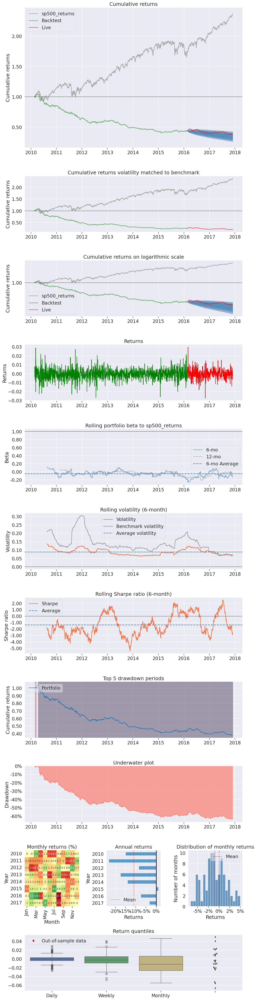

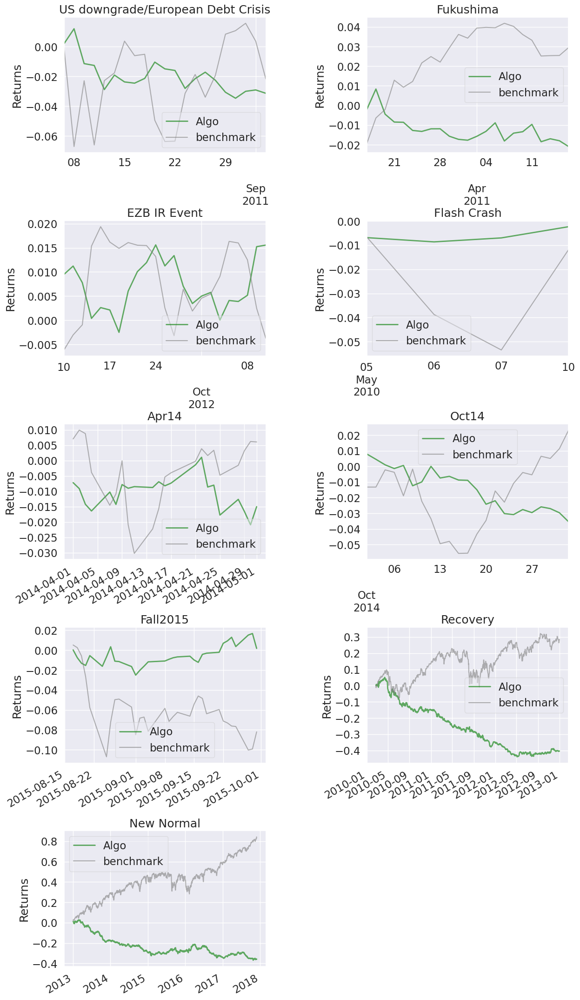

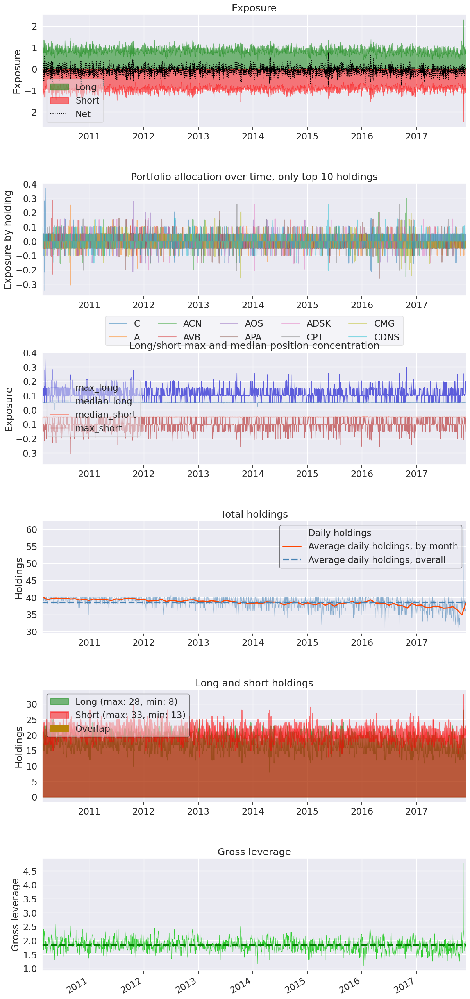

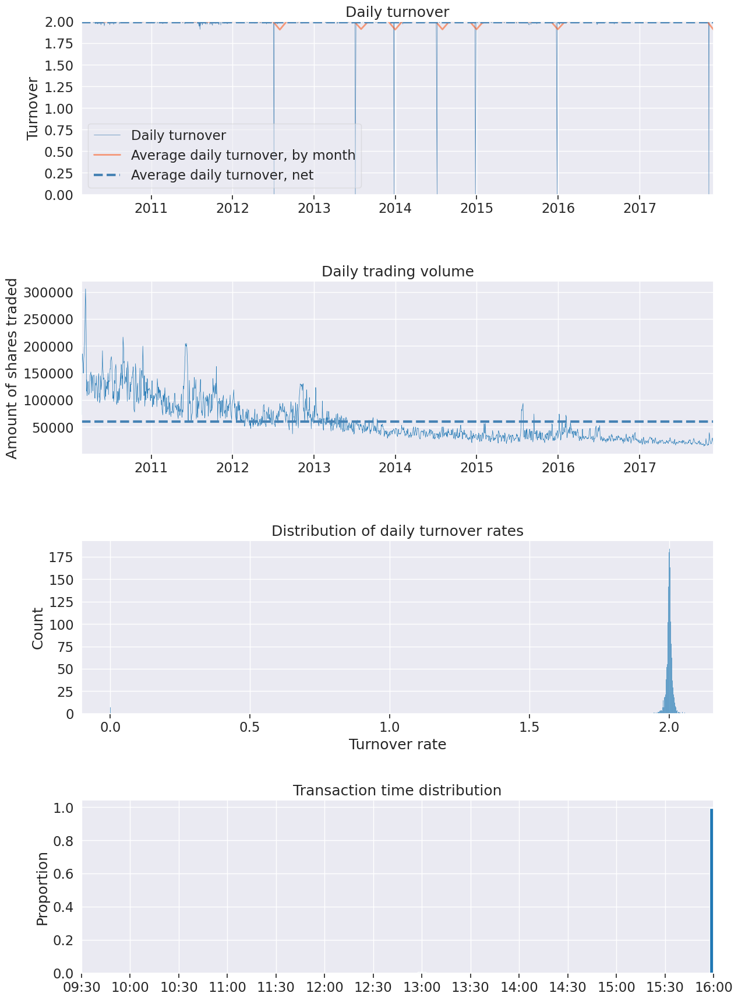

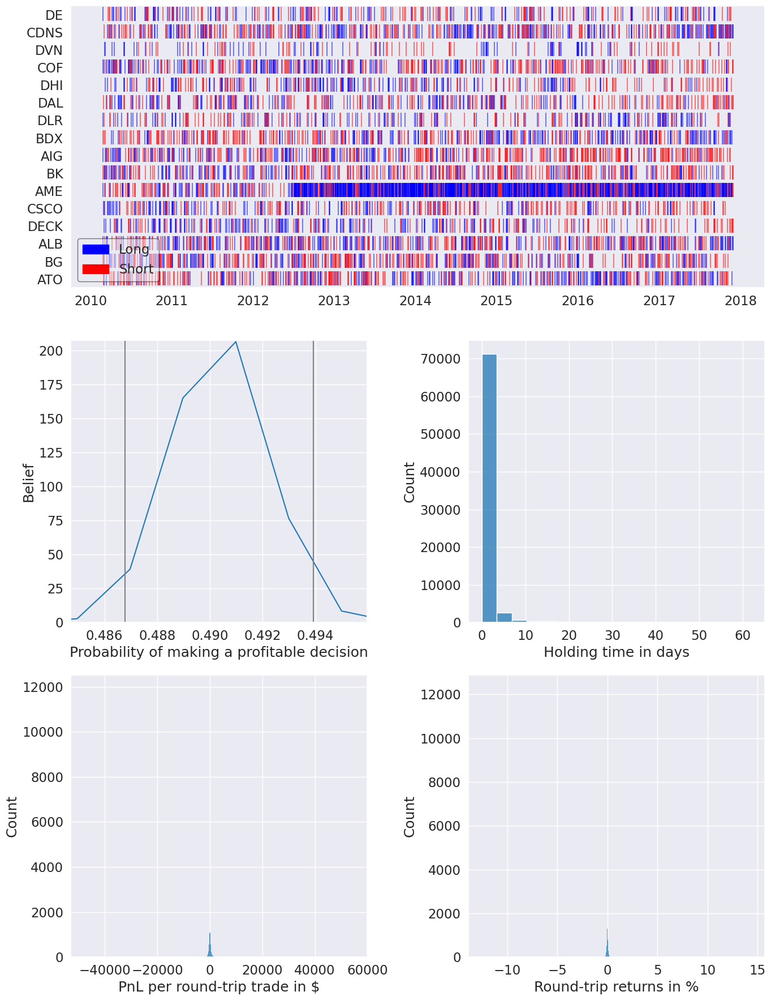

In [27]:
pf.create_full_tear_sheet(
    returns,
    positions=positions,
    transactions=transactions,
    benchmark_rets=benchmark_data,
    live_start_date=LIVE_DATE,
    round_trips=True
)